In [1]:
import os

# Step 1: Setup and Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import seaborn as sns
import matplotlib.animation as animation
from IPython.display import Image

from scipy.stats import gaussian_kde, norm, t

sns.set(style="whitegrid")

title_font = 18
labels_font = 16
text_font = 14
tick_font = 12
images_dir = "../images/evaluation_2"

# How Good is My Model? Part 2

This notebook supports [this](https://afnan-sultan.github.io/posts/2025/08/evaluation2/) blog post by plotting the different plots shown in it. It is also a continuation on Part 1 of this series:
<br>How Good is My Model? Part 1: µ ± σ and a Bit More | [blog](https://afnan-sultan.github.io/posts/2025/08/evaluation1/), [notebook](https://github.com/Afnan-Sultan/blog-post-tutorials/blob/master/How%20Good%20is%20My%20Model%3F%20Part%201.ipynb)

This notebook guides one to:

1. Animate the Glivenko-Cantelli theorem for getting distribution's true shape
2. Animate the Law of Large Number (LLN) for getting the distribution's true mean
3. Animate the Central Limit Theorem (CLT) for approximating the range of a distribution's true mean
4. Exploring the concept of Confidence Interval (CI) made useful by the CLT.
5. Simulating violations of the Independent and Identically Distributed (I.I.D.) conditions required for CLT, and how this can mislead one's analysis.
6. Beyond I.I.D., the number of samples and the number of datapoints in each sample matters.

TL;DR
![image](images/evaluation_2/mindmap.png)

---

# The three simplifications

In the blog post, I explain how my model's performance is a distribution that tells me what is common and what is rare. If I want to speak with utmost confidence about my model's performance, then I need to arrive at this distribution.

What do I need to know the true distribution of anything I am interested in?

I need **enough** i.i.d. observations from this distribution. And this is what the Galivenko-Cantelli theorem states.

## 1. The Galivenko-Cantelli (GC) theorem

>So, the GC theorem says that the difference between the empirical cumulative density function (CDF) (i.e., the shape that will emerge after inspecting real observations) and the true CDF will approach zero as the number of observations approaches infinity.

Putting this in plain English, all what this theorem says is: I gurantee you that if you keep inspecting new observations until the number of observations is ridiculously large, you will arrive at the true CDF of your distribution.

And CDF is a direct function to get the distribution shape.

So, to speak with utmost confidence about my model's performance, I need to know its shape. And to know its shape, two brilliant mathematicians made a theorem to tell me that this is possible... only if I have a ridiculous number of observations to test my model on.

And reality is telling me...
<br>Nope.
<br>Not gonna happen.
<br>No ridiculous number of observations for you.
<br>Find another way to talk about your model confidently.

## 2. The Law of Large Number (LLN)

Because I cannot know the true shape of my model's performance distribution empirically, another thing I can try to know is the mean (µ) of this distribution.

Since we are currently speaking about model's error distribution...
<br>And since there is this assumption that a model's error distribution will (or should) follow a normal distribution...
<br>And since the mean (µ) of a normal distribution is a very powerful piece of information cuz it tells me what is typical...
<br>Then this seems to be a good compromise...

And LLN is helping me identify the requirements to know this µ. So, what does LLN say?

>It says that if i calculate the average of a large number of i.i.d. observations, I will eventually converge to the true value of my distribution's mean.

Hmmm, this doesn't feel like changing my situation much. This law is still asking me to have large i.i.d. observations...
<br>And reality is still saying nope... not gonna happen!

### A slight detour...

So, how is this different from the GC theorem?

Well, the question, and the answer, are not gonna be relevant to the topic we are discussing. But I tried to answer it just out of pure love for exploration!

Looks like, even tho the two theorems are asking for **large** i.i.d. observations, the "large" of LLN is smaller than the "large" of GC!

In the below code, You will see an animation for the convergence of both distribution shape (GC) and the distribution mean (LLN), and you will see that LLN converges quicker than GC.


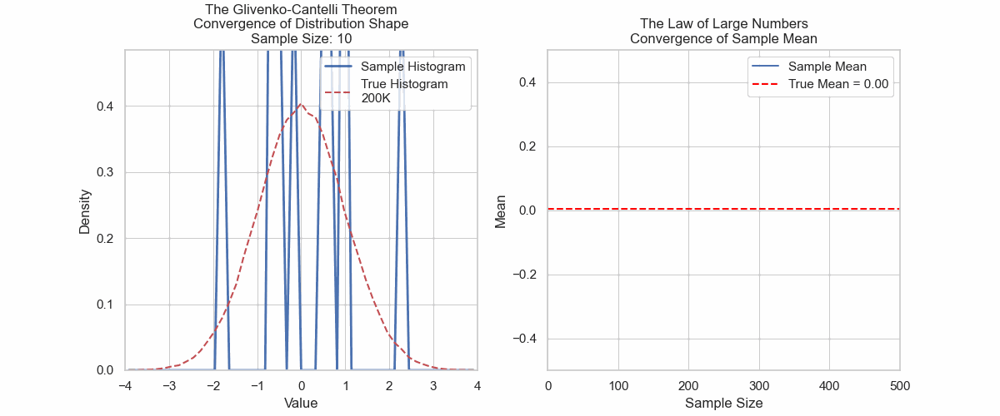

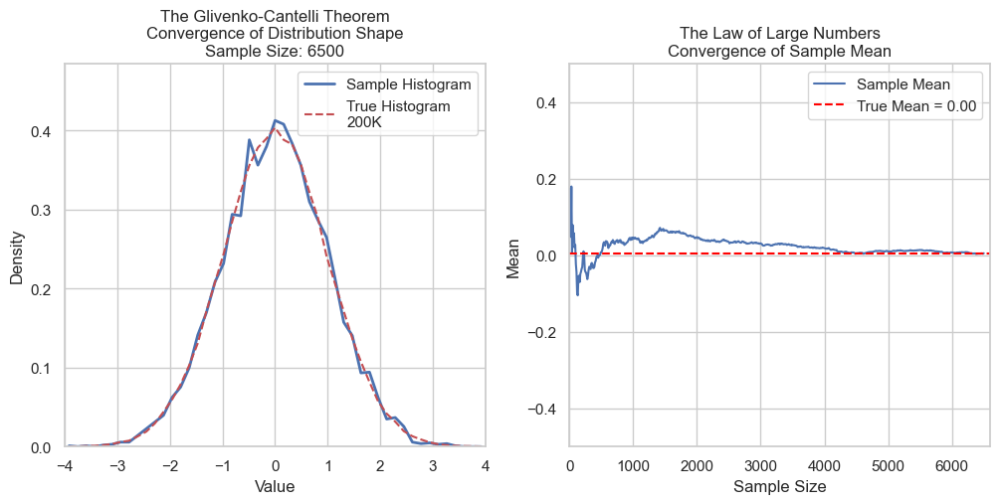

In [2]:
# Generate 200,000 samples from a normal distribution
np.random.seed(40)
population_size = 200_000
mu = 0
sigma = 1
full_data = np.random.normal(loc=mu, scale=sigma, size=population_size)

# Histogram setup
bins = np.linspace(-4, 4, 50)
bin_centers = (bins[:-1] + bins[1:]) / 2
true_hist_vals, _ = np.histogram(full_data, bins=bins, density=True)

# Precompute the true mean
true_mean = np.mean(full_data)

# Setup figure with two subplots
fig, (ax_hist, ax_mean) = plt.subplots(1, 2, figsize=(12, 5))

# --- Left: Histogram ---
sample_line, = ax_hist.plot([], [], lw=2, label='Sample Histogram')
true_line, = ax_hist.plot(bin_centers, true_hist_vals, 'r--', label=f'True Histogram\n{population_size/1000:.0f}K')
ax_hist.set_xlim(-4, 4)
ax_hist.set_ylim(0, np.max(true_hist_vals) * 1.2)
ax_hist.set_title("Convergence of Sample Histogram")
ax_hist.set_xlabel("Value")
ax_hist.set_ylabel("Density")
ax_hist.legend(loc=1)

# --- Right: Sample mean convergence ---
sample_means = []
sample_sizes = []
mean_line, = ax_mean.plot([], [], 'b-', label='Sample Mean')
true_mean_line = ax_mean.axhline(true_mean, color='red', linestyle='--', label=f'True Mean = {true_mean:.2f}')
ax_mean.set_xlim(0, 2000)
ax_mean.set_ylim(mu - 0.5, mu + 0.5)
ax_mean.set_title("The Law of Large Numbers\nConvergence of Sample Mean")
ax_mean.set_xlabel("Sample Size")
ax_mean.set_ylabel("Mean")
ax_mean.legend(loc=1)

# Init
def init():
    sample_line.set_data([], [])
    mean_line.set_data([], [])
    return sample_line, mean_line

# Update per frame
def update(frame):
    sample_size = (frame + 1) * 10
    current_data = full_data[:sample_size]

    # Update histogram
    sample_hist_vals, _ = np.histogram(current_data, bins=bins, density=True)
    sample_line.set_data(bin_centers, sample_hist_vals)
    ax_hist.set_title(f"The Glivenko-Cantelli Theorem\nConvergence of Distribution Shape\nSample Size: {sample_size}")

    # Update mean tracking
    sample_mean = np.mean(current_data)
    sample_means.append(sample_mean)
    sample_sizes.append(sample_size)
    mean_line.set_data(sample_sizes, sample_means)
    ax_mean.set_xlim(0, max(500, sample_size + 100))

    return sample_line, mean_line

# Create animation
ani = animation.FuncAnimation(
    fig, update, frames=650, init_func=init, blit=True, interval=500
)

# Save as GIF
gif_path = os.path.join(images_dir, f"gc_and_lln_convergence_{mu}{sigma}.gif")
ani.save(gif_path, writer='pillow', fps=10)

# Show GIF in notebook
Image(filename=gif_path)


---

## 3. The Central Limit Theorem (CLT)

So, reality has already said *NOPE* to GC and LLN, and we need to find another compromise that reality would agree to. And this compromise could be CLT.

What CLT says is that, for any distribution of any shape, if one samples `K` i.i.d. samples and collects the mean of each sample, the distribution of these means is guaranteed to follow a normal distribution.

Hmmm, what is happening here? What are we arriving at exactly??

Well, CLT took the stubbornness of reality and raised it an approximation.

>CLT says: OK guys. We lost the battle, but we need not lose the war. If we cannot pinpoint the exact value of the distribution mean, let's narrow it down to a specific range. What I can offer you is a guarantee that this range will fall under the territory of a normal distribution.

Check the below animation to see me work in action...

What you will see there is:
1. A true distribution that, in reality, we know nothing of. We only get access to few observations now and then (here, it's 50 observations).
2. Each sample of 50 datapoints follows a distribution that can take any shape. It's not necessarily the ture distribution shape, and it is not relevant. We only care about the mean of this distribution.
3. The more means you collect, the more the distribution of these means will converge to a normal distribution!

And this normal distribution will be our approximation to the true distribution's mean.

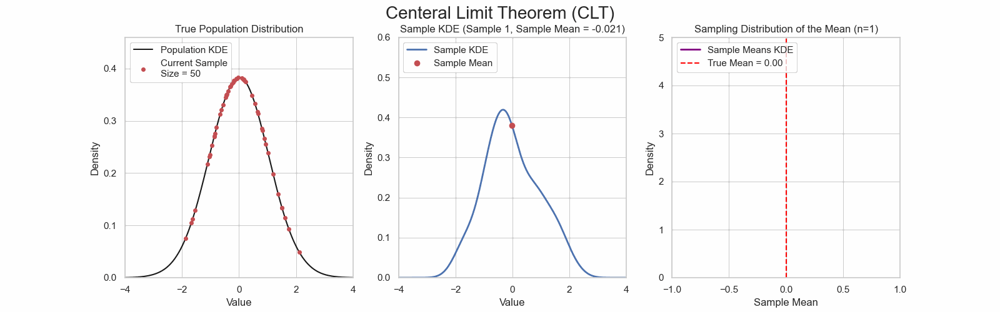

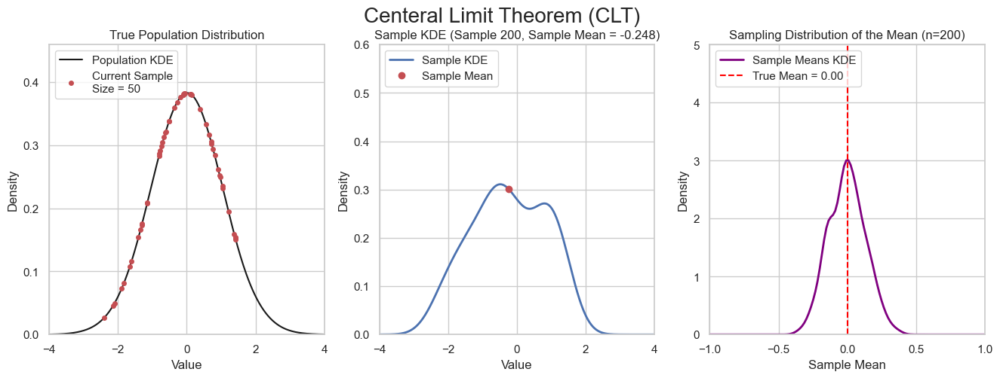

In [3]:
# -------------------
# 1. Generate data
# -------------------
np.random.seed(0)
population_size = 200_000
sample_size = 50
num_frames = 200

mu = 0
sigma = 1
population = np.random.normal(loc=mu, scale=sigma, size=population_size)
true_mean = np.mean(population)

# KDE of full population (fixed)
x_vals = np.linspace(-4, 4, 500)
kde_population = gaussian_kde(population, bw_method=0.3)
kde_population_y = kde_population(x_vals)

# Store sample means across frames
collected_means = []

# -------------------
# 2. Set up figure with 3 subplots
# -------------------
fig, (ax_pop, ax_sample, ax_means) = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle('Centeral Limit Theorem (CLT)', fontsize=20)
# --- Plot 1: Population KDE with highlighted sample points ---
line_pop_kde, = ax_pop.plot(x_vals, kde_population_y, 'k-', label='Population KDE')
dots_sample, = ax_pop.plot([], [], 'ro', markersize=4, label=f'Current Sample\nSize = {sample_size}')
ax_pop.set_xlim(-4, 4)
ax_pop.set_ylim(0, max(kde_population_y) * 1.2)
ax_pop.set_title("True Population Distribution")
ax_pop.set_xlabel("Value")
ax_pop.set_ylabel("Density")
ax_pop.legend(loc='upper left')

# --- Plot 2: KDE of current sample ---
line_sample_kde, = ax_sample.plot([], [], lw=2, label='Sample KDE')
dot_sample_mean, = ax_sample.plot([], [], 'ro', label='Sample Mean', markersize=6)
ax_sample.set_xlim(-4, 4)
ax_sample.set_ylim(0, 0.6)
ax_sample.set_title("Sample Distribution (n=200)")
ax_sample.set_xlabel("Value")
ax_sample.set_ylabel("Density")
ax_sample.legend(loc='upper left')

# --- Plot 3: Distribution of sample means ---
line_means_kde, = ax_means.plot([], [], lw=2, color='purple', label='Sample Means KDE')
ax_means.axvline(true_mean, color='red', linestyle='--', label=f'True Mean = {true_mean:.2f}')
ax_means.set_xlim(-1, 1)
ax_means.set_ylim(0, 5)
ax_means.set_title("Sampling Distribution of the Mean")
ax_means.set_xlabel("Sample Mean")
ax_means.set_ylabel("Density")
ax_means.legend(loc='upper left')

# -------------------
# 3. Animation functions
# -------------------
def init():
    line_sample_kde.set_data([], [])
    dot_sample_mean.set_data([], [])
    line_means_kde.set_data([], [])
    dots_sample.set_data([], [])
    return line_sample_kde, dot_sample_mean, line_means_kde, dots_sample

def update(frame):
    # Step 1: Draw a new sample
    sample = np.random.choice(population, size=sample_size, replace=False)
    sample_mean = np.mean(sample)

    # Step 2: Plot sample points on the KDE curve of the population
    sample_y_on_kde = kde_population(sample)
    dots_sample.set_data(sample, sample_y_on_kde)

    # Step 3: Sample KDE
    kde_sample = gaussian_kde(sample, bw_method=0.4)
    kde_sample_y = kde_sample(x_vals)
    line_sample_kde.set_data(x_vals, kde_sample_y)
    dot_sample_mean.set_data([sample_mean], [kde_sample(sample_mean)])

    # Step 4: Update distribution of means
    collected_means.append(sample_mean)
    if len(collected_means) > 1:
        kde_means = gaussian_kde(collected_means, bw_method=0.3)
        kde_means_y = kde_means(x_vals)
        line_means_kde.set_data(x_vals, kde_means_y)

    # Titles
    ax_sample.set_title(f"Sample KDE (Sample {frame+1}, Sample Mean = {sample_mean:.3f})")
    ax_means.set_title(f"Sampling Distribution of the Mean (n={len(collected_means)})")

    return line_sample_kde, dot_sample_mean, line_means_kde, dots_sample


# -------------------
# 4. Run and save animation
# -------------------
ani = animation.FuncAnimation(
    fig, update, frames=num_frames, init_func=init, blit=True, interval=1000
)

gif_path = os.path.join(images_dir, f"clt_{num_frames}_{sample_size}.gif")
ani.save(gif_path, writer='pillow', fps=4)

# -------------------
# 5. Show in notebook
# -------------------
Image(filename=gif_path)


---

But... But... How is this a solution? Why is CLT so proud of this solution it's offering??

Well, because CLT is "taking the stubbornness of life to the normal distribution territory" as it said.
<br>And normal distribution is one of the kindest distributions out there!

Why the kindest?
<br>Because it's well-behaved, well-understood, and well-studied.

And what I mean by all these "well-s" is that we know the probabilities under this distribution very well.

And this knowledge of probabilities under a distribution gives us the sweet gift of confidence intervals (CIs)

## Confidence Interval (CI)

CI is a concept that follows from knowing the probabilities under a distribution.

Once I know a distribution well enough, I get to know things like where 70% of my observations are more likely to occur. And it's this `x`% that gives me the CIs I am interested at.

Let's check the kind normal distribution. The characteristic of this distribution goes as follows:
1. **Symmetry** (i.e., the distribution looks the same on both sides of the mean)
2. Follows a **bell shape** (i.e., the distribution has only one peak)
3. Follows the **68-95-99.7% rule** (i.e., 68% of the observations are one standard deviation (SD) from the mean, 95% are two SDs away, and 99.7% are three SDs away.)

So, by just knowing that something follows a normal distribution, all we need to know is the mean (µ) and SD (σ), and one gets to know all these information by default.

And it's this third characteristic that is at the heart of CI.

* If I want to narrow down the range of the ture mean with 100% confidence, then I include the full range of the distribution.
* If I am good with 95% confidence, then I need only report the interval that is two σ away from the mean
* If I want another confidence level that is not immediately in the 68-95-99.7% rule, let's say 80%, then I have a nice equation that calculates the corresponding interval immediately (more on this equation later)

The main message is, if my distribution is normal, my life is much easier, I can get any CI I would hope for very easily.

The below code displays the CIs pre-defined in the 68-95-99.7% rule, and another CI of interest as well...

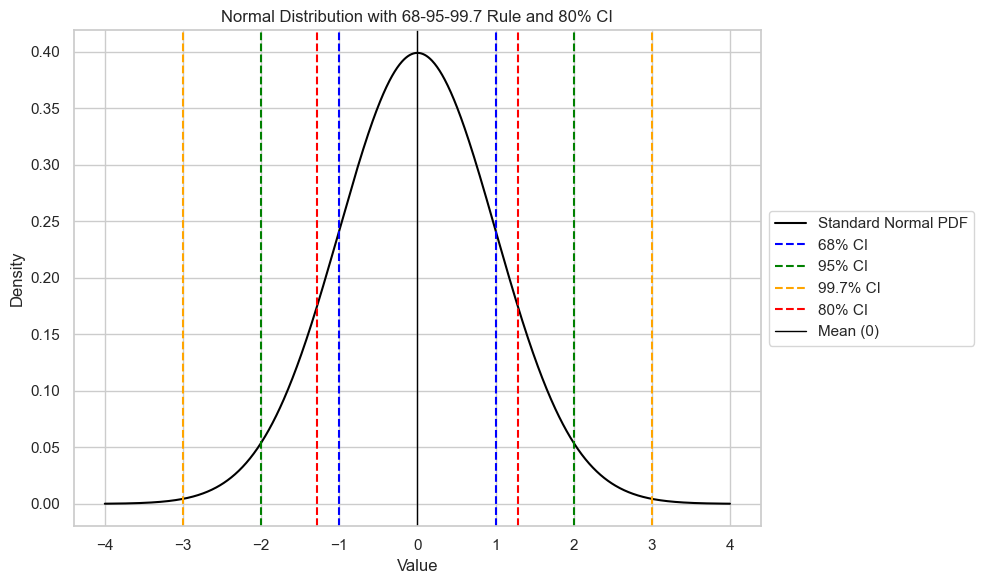

In [4]:
# Standard normal parameters
mu = 0
sigma = 1
x = np.linspace(-4, 4, 1000)
y = norm.pdf(x, mu, sigma)

# Z-scores for each confidence level
z_68 = 1
z_95 = 2
z_997 = 3
z_80 = norm.ppf(0.9)  # for central 80% interval

# Plot the normal curve
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(x, y, label='Standard Normal PDF', color='black')

# Add dashed lines for each CI range
def add_ci_lines(z, label, color):
    ax.axvline(mu - z, linestyle='--', color=color, label=f'{label} CI')
    ax.axvline(mu + z, linestyle='--', color=color)

add_ci_lines(z_68, '68%', 'blue')
add_ci_lines(z_95, '95%', 'green')
add_ci_lines(z_997, '99.7%', 'orange')
add_ci_lines(z_80, '80%', 'red')

# Mean line
ax.axvline(mu, color='black', linestyle='-', linewidth=1, label='Mean (0)')

# Title and labels
ax.set_title("Normal Distribution with 68-95-99.7 Rule and 80% CI")
ax.set_xlabel("Value")
ax.set_ylabel("Density")
ax.grid(True)

# Place legend outside the plot (to the right)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Adjust layout to fit the legend
plt.tight_layout()
plt.savefig(os.path.join(images_dir, f"normal_dist_CI.png"))
plt.show()


---

So, now that we know getting the distribution shape and mean are not easy, and CLT is offereing us a peaceful approximation under the normal distribution, we go back to our example from the last notebook.

# Back to simulation land

I start from the same place I left in the last [notebook](https://github.com/Afnan-Sultan/blog-post-tutorials/blob/master/How%20Good%20is%20My%20Model%3F%20Part%201.ipynb), sampling variability. I use the same code to simulate 10 samples each of sizes 200 to work as small test sets, and the `Gold Standsrd` test set of 10K.

One can see that each sample did not produce the `Expected` value of the `Gold Standard`.

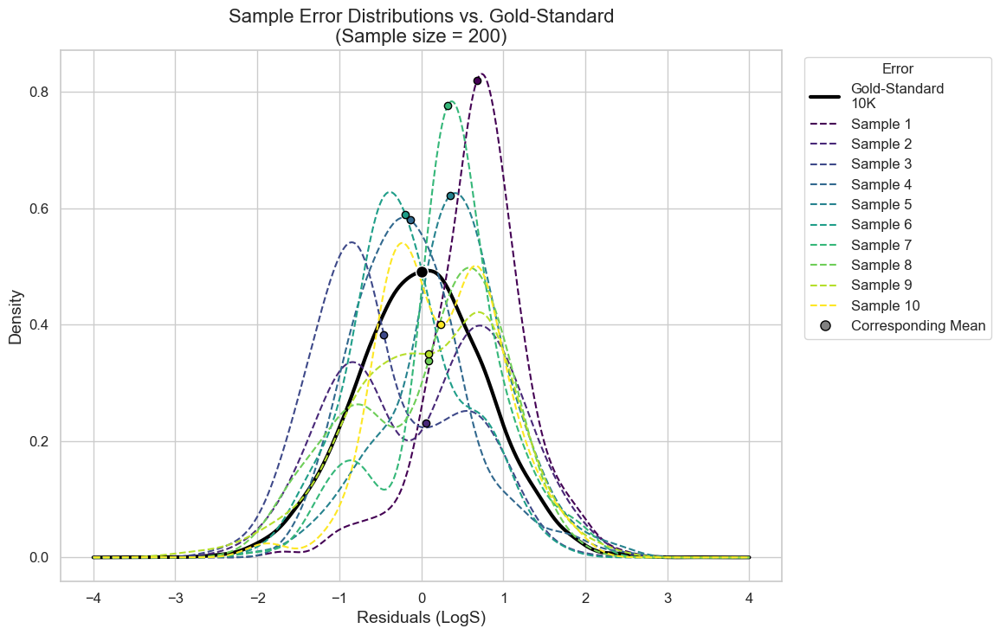

In [5]:
np.random.seed(40)

# --- Generate gold standard distribution ---
mu_gold_error = 0
sigma_gold_error = 0.8
gold_standard_test_size = 10000
model_true_performance = np.random.normal(loc=mu_gold_error, scale=sigma_gold_error, size=gold_standard_test_size)

# --- Parameters ---
num_samples = 10
sample_size = 200

# --- Compute quantiles ---
quantile_bins = pd.qcut(model_true_performance, q=4, labels=False, duplicates='drop')
gold_df = pd.DataFrame({'LogS': model_true_performance, 'bin': quantile_bins})

iid_samples = []
labels = []

for i in range(num_samples):
    probs = np.random.dirichlet(alpha=np.ones(4), size=1).flatten()
    counts = (probs * sample_size).astype(int)
    counts[-1] = sample_size - counts[:-1].sum()

    data = []
    for q, n in enumerate(counts):
        available = gold_df[gold_df['bin'] == q]['LogS']
        if len(available) >= n:
            data.extend(np.random.choice(available, size=n, replace=False))
        else:
            data.extend(np.random.choice(available, size=n, replace=True))

    label = f"Sample {i+1}"
    iid_samples.append(np.array(data))
    labels.append(label)

# --- Plotting ---
plt.figure(figsize=(12, 7.5))

# KDE for gold standard
gold_kde = gaussian_kde(model_true_performance)
x_vals = np.linspace(-4, 4, 500)
gold_y_vals = gold_kde(x_vals)
plt.plot(x_vals, gold_y_vals, linewidth=3, color='black', label=f"Gold-Standard\n{len(model_true_performance)//1000}K")

# Plot dot at mean of gold standard
gold_mean = np.mean(model_true_performance)
gold_mean_y = gold_kde(gold_mean)
plt.scatter(gold_mean, gold_mean_y, color='black', edgecolor='white', s=100, zorder=6)

# Sample KDEs
colors = plt.cm.viridis(np.linspace(0, 1, num_samples))
for i, (sample, label) in enumerate(zip(iid_samples, labels)):
    kde = gaussian_kde(sample)
    sample_y_vals = kde(x_vals)
    plt.plot(x_vals, sample_y_vals, linestyle='--', color=colors[i], label=label)

    sample_mean = np.mean(sample)
    sample_mean_y = kde(sample_mean)
    plt.scatter(sample_mean, sample_mean_y, color=colors[i], edgecolor='black', zorder=5)

# --- Custom Legend for Mean Dots ---
mean_dot_legend = Line2D(
    [0], [0],
    marker='o',
    color='w',
    markerfacecolor='gray',
    markeredgecolor='black',
    markersize=8,
    label='Corresponding Mean'
)

# Collect existing handles and labels, then append custom dot
handles, labels_ = plt.gca().get_legend_handles_labels()
handles.append(mean_dot_legend)
labels_.append("Corresponding Mean")

# Final touches
plt.title(f"Sample Error Distributions vs. Gold-Standard\n(Sample size = {sample_size})", fontsize=16)
plt.xlabel("Residuals (LogS)", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.legend(handles=handles, labels=labels_, loc='upper right', bbox_to_anchor=(1.3, 1),
           title="Error", title_fontsize=12, fontsize=12)
plt.tick_params(axis='both', labelsize=12)
plt.tight_layout()

# Save and display
plt.savefig(os.path.join(images_dir, 'sampling_uncertainty.png'))
plt.show()

# CLT in action on my simulated small test sets

Now, we get the chance to construct the means distribution of these samples, and obtain a CI for where the mean could be.

Below, I chose a CI of 90%, and the range is -0.08 to 0.29.

In this case, I know the true mean cuz I simulated the distribution, and I can see that it is indeed included in that estimated range.

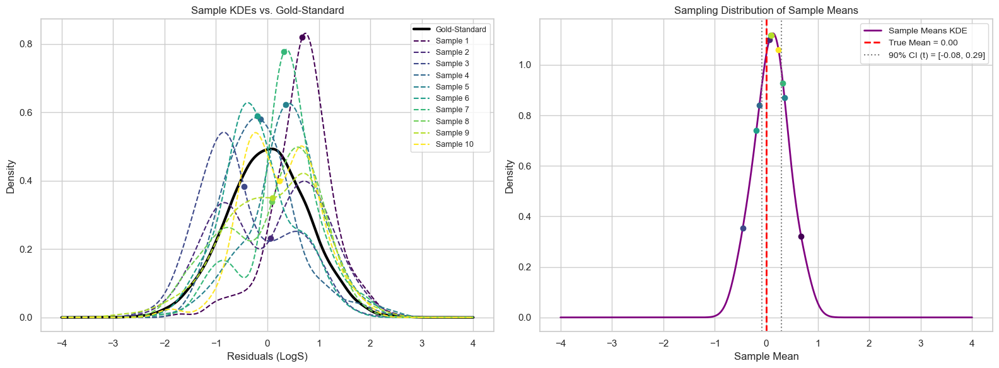

In [6]:
# Make sure sample_means are computed
sample_means = [np.mean(s) for s in iid_samples]

# KDE of gold-standard population
x_vals = np.linspace(-4, 4, 500)
kde_gold = gaussian_kde(model_true_performance)
kde_gold_y = kde_gold(x_vals)
true_mean = np.mean(model_true_performance)

# KDE of sample means
kde_means = gaussian_kde(sample_means)
kde_means_y = kde_means(x_vals)

# Compute parametric 90% CI using t-distribution
x_bar = np.mean(sample_means)
s = np.std(sample_means, ddof=1)
n = len(sample_means)
alpha = 0.10
t_crit = t.ppf(1 - alpha / 2, df=n - 1)

margin_error = t_crit * s / np.sqrt(n)
lower_90 = x_bar - margin_error
upper_90 = x_bar + margin_error

# Get consistent colors for all samples
colors = plt.cm.viridis(np.linspace(0, 1, len(iid_samples)))

# Plotting
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# -------------------
# Left Plot: Sample KDEs with Means
# -------------------
ax1.plot(x_vals, kde_gold_y, color='black', linewidth=3, label="Gold-Standard")

for i, (sample, label) in enumerate(zip(iid_samples, labels)):
    kde = gaussian_kde(sample)
    y_vals = kde(x_vals)
    ax1.plot(x_vals, y_vals, linestyle='--', color=colors[i], label=label)

    sample_mean = sample_means[i]
    mean_y = kde(sample_mean)
    ax1.plot(sample_mean, mean_y, 'o', color=colors[i], markersize=6)

ax1.set_title("Sample KDEs vs. Gold-Standard")
ax1.set_xlabel("Residuals (LogS)")
ax1.set_ylabel("Density")
ax1.legend(loc='upper right', fontsize=9)

# -------------------
# Right Plot: Sampling Distribution of Sample Means
# -------------------
ax2.plot(x_vals, kde_means_y, color='purple', linewidth=2, label="Sample Means KDE")

# Dots for sample means at their KDE y-values
for i, mean in enumerate(sample_means):
    y_val = kde_means(mean)
    ax2.plot(mean, y_val, 'o', color=colors[i], markersize=6)

# True mean and t-based CI
ax2.axvline(true_mean, color='red', linestyle='--', linewidth=2, label=f"True Mean = {true_mean:.2f}")
ax2.axvline(lower_90, color='gray', linestyle=':', label=f"90% CI (t) = [{lower_90:.2f}, {upper_90:.2f}]")
ax2.axvline(upper_90, color='gray', linestyle=':')

ax2.set_title("Sampling Distribution of Sample Means")
ax2.set_xlabel("Sample Mean")
ax2.set_ylabel("Density")
ax2.legend(loc='upper right', fontsize=10)

plt.tight_layout()
plt.savefig(os.path.join(images_dir, 'means_distribution.png'))
plt.show()


# Independant and identically distributed (i.i.d.)

However, there are two conditions for each sample to be confident that my means distribution will be centered around the true mean of my model's performance
1. **Independent** (e.g., the molecules in one sample are not the same or related to each other)
2. **Identically Distributed** (e.g., all molecules are measured for the same property under the same condition)

Below, I will simulate cases to show what happens when these conditions are violated.

---

## Violation of independence

Below, I simulate 10 samples of size 200 as well, however, this time I am tampering with the sampling to make it dependent.

Dependency means that the datapoints in a given sample are related to each other. For example, all molecules have the same features with a minor not-that-significant difference. So, all of them will end up getting very similar predictions.

I simulate this by first selecting a point from the `Gold Standard` distribution to work as an anchor, then sample the remaining 199 points in this sample to be tightly clustered around this point.

I do this for 10 times, and you can see how the means distribution has changed its mean and shape!

It's no longer normal, and the CI is not to be trusted.

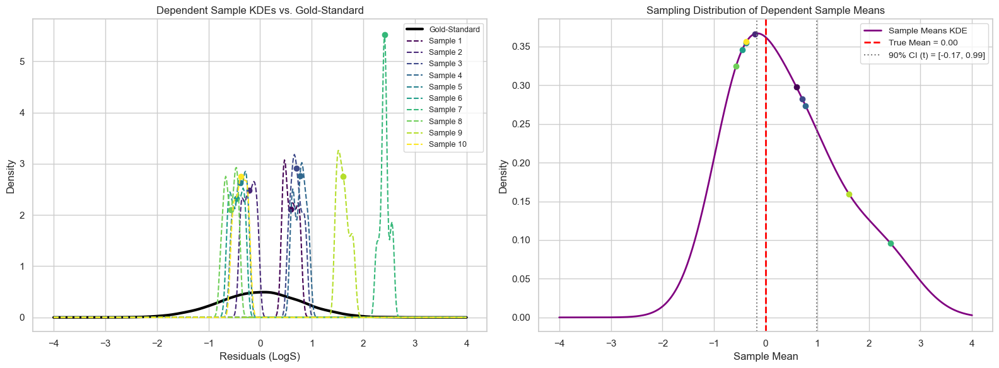

In [7]:
np.random.seed(40)
num_samples = 10
sample_size = 200
cluster_width = 0.2

id_samples = []
sample_means = []
labels = []

# Generate dependent samples
for i in range(num_samples):
    anchor = np.random.choice(model_true_performance)

    cluster = model_true_performance[
        (model_true_performance > anchor - cluster_width) &
        (model_true_performance < anchor + cluster_width)
    ]

    if len(cluster) >= sample_size:
        sample = np.random.choice(cluster, size=sample_size, replace=False)
    else:
        sample = np.random.choice(cluster, size=sample_size, replace=True)

    id_samples.append(sample)
    sample_means.append(np.mean(sample))
    labels.append(f"Sample {i+1}")

# KDE for gold standard
x_vals = np.linspace(-4, 4, 500)
kde_gold = gaussian_kde(model_true_performance)
kde_gold_y = kde_gold(x_vals)
true_mean = np.mean(model_true_performance)

# KDE for sample means
kde_means = gaussian_kde(sample_means)
kde_means_y = kde_means(x_vals)

# Compute 90% CI using t-distribution
x_bar = np.mean(sample_means)
s = np.std(sample_means, ddof=1)
n = len(sample_means)
alpha = 0.10
t_crit = t.ppf(1 - alpha / 2, df=n - 1)

margin_error = t_crit * s / np.sqrt(n)
lower_90 = x_bar - margin_error
upper_90 = x_bar + margin_error

# Colors
colors = plt.cm.viridis(np.linspace(0, 1, num_samples))

# Plotting
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# --- Left: Dependent sample KDEs ---
ax1.plot(x_vals, kde_gold_y, color='black', linewidth=3, label="Gold-Standard")

for i, (sample, label) in enumerate(zip(id_samples, labels)):
    kde = gaussian_kde(sample)
    y_vals = kde(x_vals)
    ax1.plot(x_vals, y_vals, linestyle='--', color=colors[i], label=label)

    sample_mean = sample_means[i]
    mean_y = kde(sample_mean)
    ax1.plot(sample_mean, mean_y, 'o', color=colors[i], markersize=6)

ax1.set_title("Dependent Sample KDEs vs. Gold-Standard")
ax1.set_xlabel("Residuals (LogS)")
ax1.set_ylabel("Density")
ax1.legend(loc='upper right', fontsize=9)

# --- Right: Distribution of sample means ---
ax2.plot(x_vals, kde_means_y, color='purple', linewidth=2, label="Sample Means KDE")

for i, mean in enumerate(sample_means):
    y_val = kde_means(mean)
    ax2.plot(mean, y_val, 'o', color=colors[i], markersize=6)

ax2.axvline(true_mean, color='red', linestyle='--', linewidth=2, label=f"True Mean = {true_mean:.2f}")
ax2.axvline(lower_90, color='gray', linestyle=':', label=f"90% CI (t) = [{lower_90:.2f}, {upper_90:.2f}]")
ax2.axvline(upper_90, color='gray', linestyle=':')

ax2.set_title("Sampling Distribution of Dependent Sample Means")
ax2.set_xlabel("Sample Mean")
ax2.set_ylabel("Density")
ax2.legend(loc='upper right', fontsize=10)

plt.tight_layout()
plt.savefig(os.path.join(images_dir, 'dependant_means_distribution.png'))
plt.show()


## Violation of identically distributed

In the blog post, we examined the naive case of testing a model trained to predict LogS between -12 and 2, on a lipophilicity dataset between -3 and 6 LogD.

In this example, a model will be bound to predict values between -12 and 2 only, and so, it will never predict anything above 2, and it will predict values way below -3.
   - Of course, this is a "moo$^{(*)}$" example, because even when the model predicts values "correctly," it will be by the mere coincidence of LogS and LogD matching!

I simulate this by:
1. Generate 10 samples of values between -3 and 6 with varying µ and σ
2. Generate predictions that are bound between -12 and 2 with varying µ and σ
3. Calculate the residuals (pred - ture)

The plot shows how the means distribution is shifted and now completely off from the model's true performance.

---

$^{(*)}$ F.R.I.E.N.D.S fans should get it! 😄

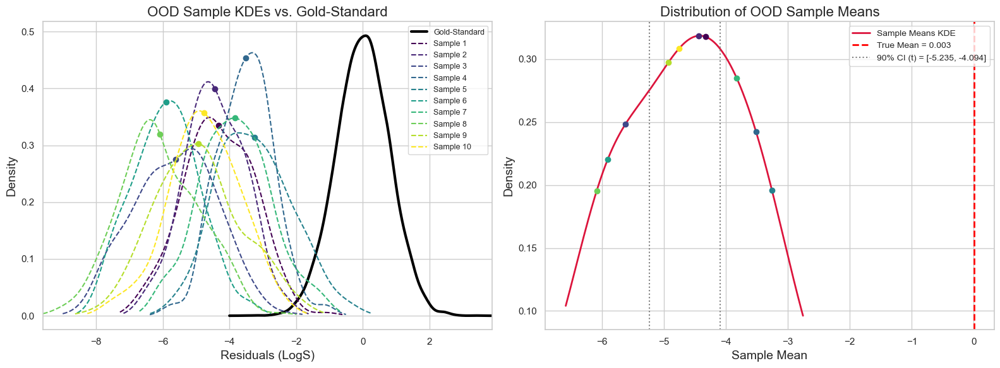

In [8]:
np.random.seed(40)

# --- Step 1: Generate OOD residuals ---
true_logs_ood = np.random.normal(loc=4, scale=1, size=gold_standard_test_size)
true_logs_ood = np.clip(true_logs_ood, -3, 6)

residuals_noise = np.random.normal(loc=0, scale=0.8, size=gold_standard_test_size)
predicted_logs = true_logs_ood + residuals_noise
predicted_logs = np.clip(predicted_logs, -12, 2)

residuals_ood = predicted_logs - true_logs_ood
quantile_bins = pd.qcut(residuals_ood, q=4, labels=False, duplicates='drop')
biased_df = pd.DataFrame({'LogS': residuals_ood, 'bin': quantile_bins})

# --- Step 2: Simulate OOD samples ---
i_samples = []
sample_means = []
labels = []

true_mean_range = (-1, 1)
true_std_range = (0.5, 1.0)
pred_mean_range = (-5.5, -3.5)
pred_std_range = (0.5, 1.0)

for i in range(num_samples):
    true_mean = np.random.uniform(*true_mean_range)
    true_std = np.random.uniform(*true_std_range)
    true_values = np.random.normal(loc=true_mean, scale=true_std, size=sample_size)
    true_values = np.clip(true_values, -3, 6)

    pred_mean = np.random.uniform(*pred_mean_range)
    pred_std = np.random.uniform(*pred_std_range)
    predicted_values = np.random.normal(loc=pred_mean, scale=pred_std, size=sample_size)
    predicted_values = np.clip(predicted_values, -12, 2)

    residuals = predicted_values - true_values
    i_samples.append(residuals)
    sample_means.append(np.mean(residuals))
    labels.append(f"Sample {i+1}")

# --- Step 3: Gold KDE on its natural range ---
x_vals_gold = np.linspace(-4, 4, 500)
kde_gold = gaussian_kde(model_true_performance)
kde_gold_y = kde_gold(x_vals_gold)
true_mean = np.mean(model_true_performance)

# --- Step 4: Sample means KDE (dynamic range) ---
sample_means = np.array(sample_means)
kde_means = gaussian_kde(sample_means)
x_vals_means = np.linspace(sample_means.min() - 0.5, sample_means.max() + 0.5, 500)
kde_means_y = kde_means(x_vals_means)

# --- Step 5: CI using t-distribution ---
x_bar = np.mean(sample_means)
s = np.std(sample_means, ddof=1)
n = len(sample_means)
alpha = 0.10
t_crit = t.ppf(1 - alpha / 2, df=n - 1)
margin_error = t_crit * s / np.sqrt(n)
lower_90 = x_bar - margin_error
upper_90 = x_bar + margin_error

# --- Step 6: Plotting ---
colors = plt.cm.viridis(np.linspace(0, 1, num_samples))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Sample KDEs vs Gold KDE (each on own range)
# Expand x-axis based on ALL data
all_data = np.concatenate([model_true_performance] + i_samples)
x_min, x_max = all_data.min(), all_data.max()
ax1.set_xlim(x_min - 0.5, x_max + 0.5)

# Gold KDE
ax1.plot(x_vals_gold, kde_gold_y, color='black', linewidth=3, label="Gold-Standard")

# OOD Sample KDEs (each on its own dynamic x-range)
for i, (sample, label) in enumerate(zip(i_samples, labels)):
    kde = gaussian_kde(sample)
    x_vals_sample = np.linspace(sample.min() - 0.5, sample.max() + 0.5, 500)
    y_vals = kde(x_vals_sample)
    ax1.plot(x_vals_sample, y_vals, linestyle='--', color=colors[i], label=label)

    sample_mean = sample_means[i]
    mean_y = kde(sample_mean)
    ax1.plot(sample_mean, mean_y, 'o', color=colors[i], markersize=6)

ax1.set_title("OOD Sample KDEs vs. Gold-Standard", fontsize=16)
ax1.set_xlabel("Residuals (LogS)", fontsize=14)
ax1.set_ylabel("Density", fontsize=14)
ax1.legend(loc='upper right', fontsize=9)

# Plot 2: Sample means KDE
ax2.plot(x_vals_means, kde_means_y, color='crimson', linewidth=2, label="Sample Means KDE")

for i, mean in enumerate(sample_means):
    y_val = kde_means(mean)
    ax2.plot(mean, y_val, 'o', color=colors[i], markersize=6)

ax2.axvline(true_mean, color='red', linestyle='--', linewidth=2, label=f"True Mean = {true_mean:.3f}")
ax2.axvline(lower_90, color='gray', linestyle=':', label=f"90% CI (t) = [{lower_90:.3f}, {upper_90:.3f}]")
ax2.axvline(upper_90, color='gray', linestyle=':')

ax2.set_title("Distribution of OOD Sample Means", fontsize=16)
ax2.set_xlabel("Sample Mean", fontsize=14)
ax2.set_ylabel("Density", fontsize=14)
ax2.legend(loc='upper right', fontsize=10)

plt.tight_layout()
plt.savefig(os.path.join(images_dir, 'different_means_distribution.png'))
plt.show()


In the real world, OOD is more realistically observed when, for example:
* One trains a model on a range of values (e.g., LogS between -7 and -3) and tests it on a different range (e.g., LogS between -9 and -6)
* One trains a model on an aqueous solubility of a certain experimental condition (e.g., apparent solubility at pH 7.4) and tests it on a different experimental setup (e.g., kinetic solubility at pH 6.8)

---

## Beyond i.i.d., sample size and number of samples

We saw above how the i.i.d. condition is important and what happens when violated. However, having i.i.d. samples are not the only factors. The number of samples and the sample size matter as well.

Let's remember how sampling works.

One samples `N` data points for `K` times, then we plot the **mean** of each sample to make a **distribution**. So, there are two things to be considered:
1. How would the calculated mean change?
2. How would the distribution shape change?

`N` answers the first questions. The more datapoints to have in an i.i.d. sample, the more diversity and representation of the true distribution one would get. Thus, the mean of this sample will get closer to the mean of the true distribution.

`K` answers the second question. The more samples to have, the more defined the distribution will get (this will be detailed in a later post about distributions). With a smoother wnd well-defined distribution, the confidence intervals become more reliable.

Below, I simulate multiple cases with varying `N` and fixing `K` and vice versa to lock this understanding in.

90% CI (t-dist) for K=50: (-0.029, 0.023)
90% CI (t-dist) for K=200: (-0.005, 0.022)
90% CI (t-dist) for K=1000: (-0.001, 0.011)


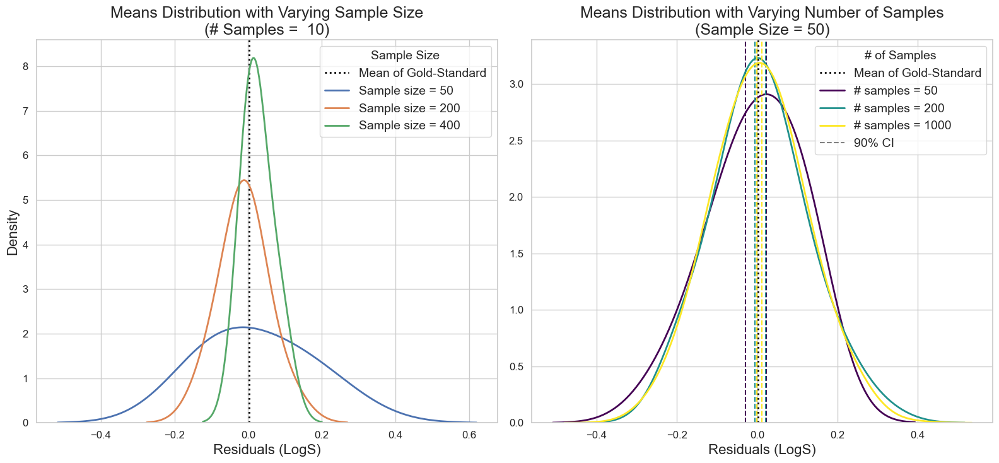

In [9]:
np.random.seed(40)

# Parameters
sample_sizes = [50, 200, 400]         # Varying sample sizes
num_samples_fixed = 10                            # Fixed number of samples for left subplot
num_samples_list = [50, 200, 1000]       # Varying number of samples for right subplot
fixed_sample_size = 50                             # Fixed sample size for right subplot

# Compute the mean of the gold-standard distribution
mean_gold = model_true_performance.mean()

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 7.5))

# === Left Plot: Varying Sample Size ===
ax = axes[0]
#sns.kdeplot(model_true_performance, linewidth=3, color='black', label='Gold-Standard', ax=ax, bw_adjust=1)
ax.axvline(mean_gold, color='black', linestyle=':', linewidth=2, label='Mean of Gold-Standard')

for sample_size in sample_sizes:
    sample_means = [
        np.mean(np.random.choice(model_true_performance, size=sample_size, replace=True))
        for _ in range(num_samples_fixed)
    ]
    sns.kdeplot(sample_means, linewidth=2, label=f"Sample size = {sample_size}", ax=ax, bw_adjust=1.5)

ax.set_title(f"Means Distribution with Varying Sample Size\n(# Samples =  {num_samples_fixed})", fontsize=title_font)
ax.set_xlabel("Residuals (LogS)", fontsize=labels_font)
ax.set_ylabel("Density", fontsize=labels_font)
ax.legend(title="Sample Size", fontsize=text_font, title_fontsize=text_font)
ax.tick_params(axis='both', labelsize=tick_font)

# === Right Plot: Varying Number of Samples ===
ax = axes[1]
#sns.kdeplot(model_true_performance, linewidth=3, color='black', label='Gold-Standard', ax=ax, bw_adjust=1)
ax.axvline(mean_gold, color='black', linestyle=':', linewidth=2, label='Mean of Gold-Standard')

colors_right = plt.cm.viridis(np.linspace(0, 1, len(num_samples_list)))

for i, num_samples in enumerate(num_samples_list):
    sample_means = [
        np.mean(np.random.choice(model_true_performance, size=fixed_sample_size, replace=True))
        for _ in range(num_samples)
    ]
    sns.kdeplot(sample_means, linewidth=2, label=f"# samples = {num_samples}", ax=ax, bw_adjust=1.5, color=colors_right[i])

    # Compute 90% CI using t-distribution
    x_bar = np.mean(sample_means)
    s = np.std(sample_means, ddof=1)
    n = len(sample_means)
    alpha = 0.10
    t_crit = t.ppf(1 - alpha / 2, df=n - 1)
    margin = t_crit * s / np.sqrt(n)
    lower = x_bar - margin
    upper = x_bar + margin

    ax.axvline(lower, color=colors_right[i], linestyle='--', linewidth=1.5)
    ax.axvline(upper, color=colors_right[i], linestyle='--', linewidth=1.5)

    print(f"90% CI (t-dist) for K={num_samples}: ({lower:.3f}, {upper:.3f})")


ax.set_title(f"Means Distribution with Varying Number of Samples\n(Sample Size = {fixed_sample_size})", fontsize=title_font)
ax.set_xlabel("Residuals (LogS)", fontsize=labels_font)
ax.set_ylabel("")  # Avoid duplicate y-axis label
ax.legend(title="# of Samples", fontsize=text_font, title_fontsize=text_font)
ax.tick_params(axis='both', labelsize=tick_font)

from matplotlib.lines import Line2D

# Custom legend handle for 90% CI dashed lines
ci_line = Line2D([0], [0], color='gray', linestyle='--', linewidth=1.5, label='90% Confidence Interval')

# Add to existing legend
handles, labels_ = ax.get_legend_handles_labels()
handles.append(ci_line)
labels_.append("90% CI")
ax.legend(handles=handles, labels=labels_, title="# of Samples", fontsize=text_font, title_fontsize=text_font)

# Final layout
plt.tight_layout()
plt.savefig(os.path.join(images_dir, 'sample_means_size_vs_num.png'))
plt.show()


# Wrapping Up

Let’s summarize:

- Estimating the *full distribution* shape: needs massive i.i.d. data (GC theorem).
- Estimating the *mean*: easier, but still requires many i.i.d. observations (LLN).
- Approximating the mean: CLT allows this through multiple small i.i.d. samples.
- These samples must be independent **and** identically distributed.
- Both the **size of each sample (N)** and the **number of samples (K)** matter.